# Домашнее задание 3

1) [1 балл] Реализуйте чтение изображений, лежащих в /data/imgs/arrow (как в демо с калибровкой камеры с семинара). Вся обязательная часть задания выполняется с этими изображениями

1) [2 балла] Реализуйте нахождение расстояния от камеры до листка, учитывая, что это тот же листок, что был в первом демо

2) [3 балла] Реализуйте приведение изображения листка к "виду сверху"

3) [6 баллов] Реализуйте определение направления, в котором указывает стрелка. Можно использовать скелетонизацию из первого семинара по зрению: получить маску темной области (стрелки) внутри изображения листка, применить скелетонизацию, вычислить направление. Можно поступить иначе: после нахождения маски вычислить градиенты Собеля по x и y и проанализировать их направления. P.S. Можно использовать и полностью свой метод

4) [3 балла] Доп. задача 1: Примените написанный Вами код к видео https://drive.google.com/file/d/1AQhg2lL5FL4edlOcxY2SHOOZ-v9TgHBD/view?usp=sharing. Загрузите видео на свой гугл диск, а затем дополните имеющийся код монтированием диска и чтением в цикле кадров видео, приведёнными в конце семинара

5) [5 баллов] Доп. задача 2: определите, нормально ли видно листок в кадре. На некоторых кадрах его видно не полностью, один или больше уголков находятся за кадром. Это можно автоматически обнаруживать, к примеру используя размеры стрелки, и выводить на соответствующем кадре маркер - текст или цветную метку

## Setup

In [1]:
import numpy as np
import cv2
import time
import os
import math
import sys
import glob
from copy import *
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (10,10)

## Task #1

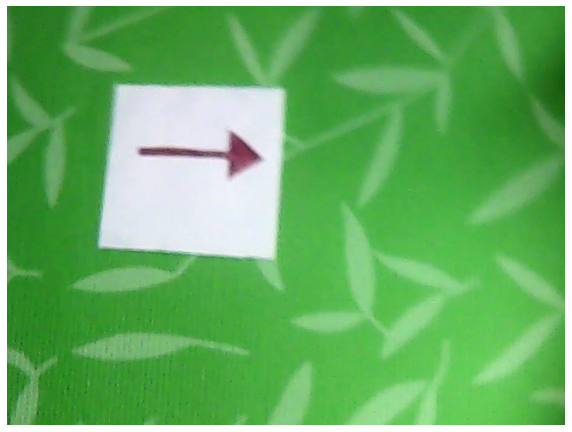

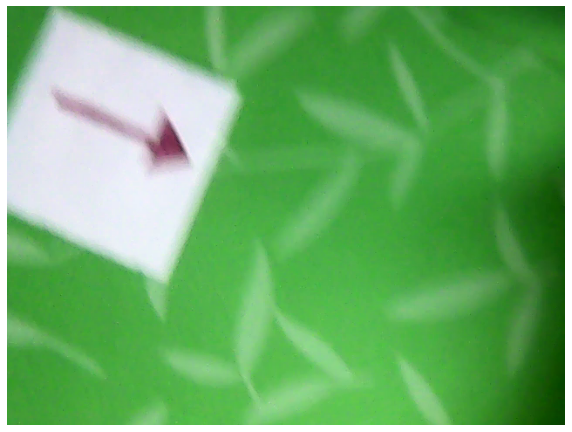

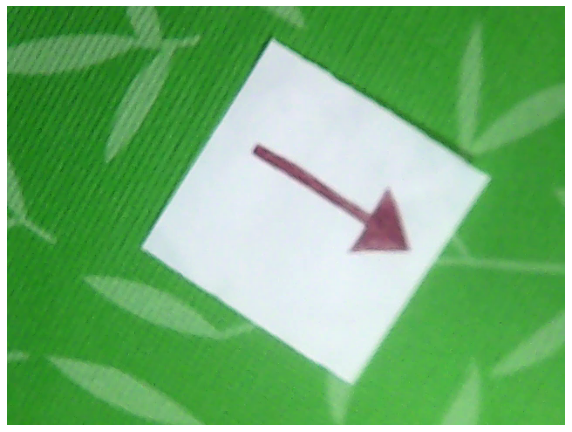

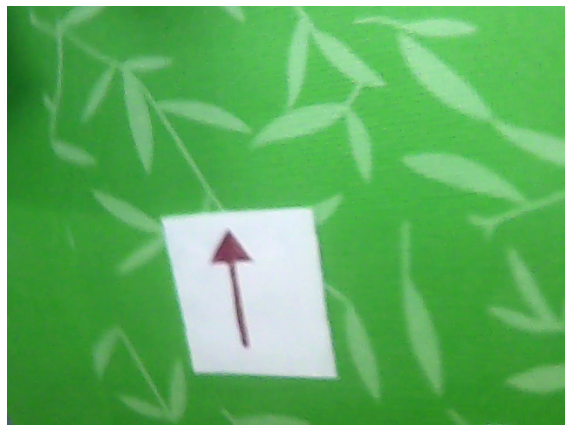

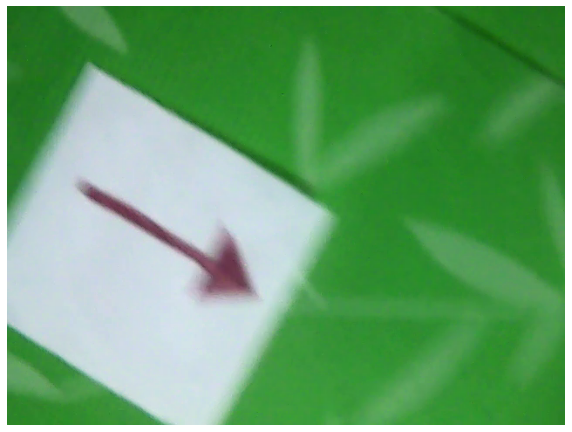

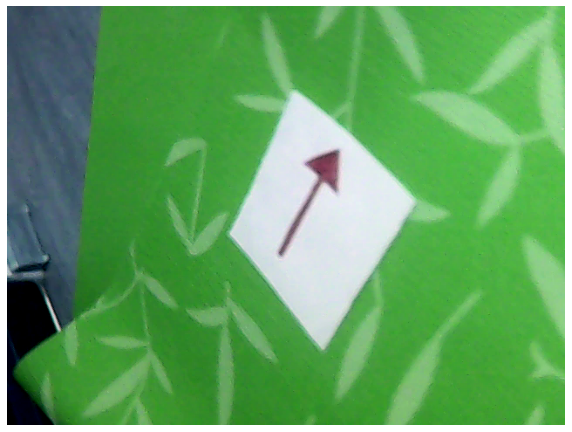

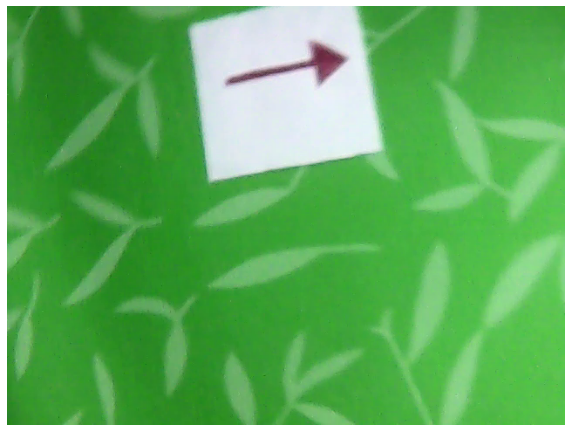

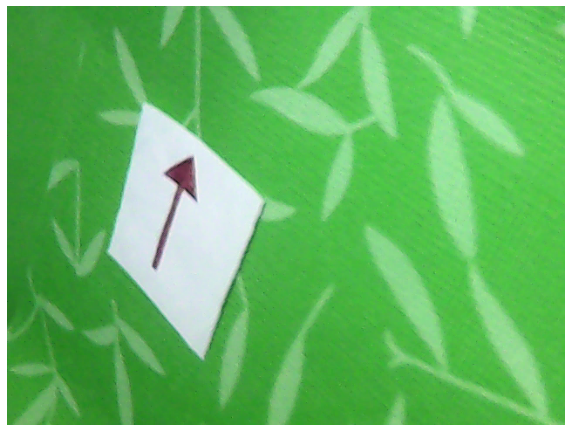

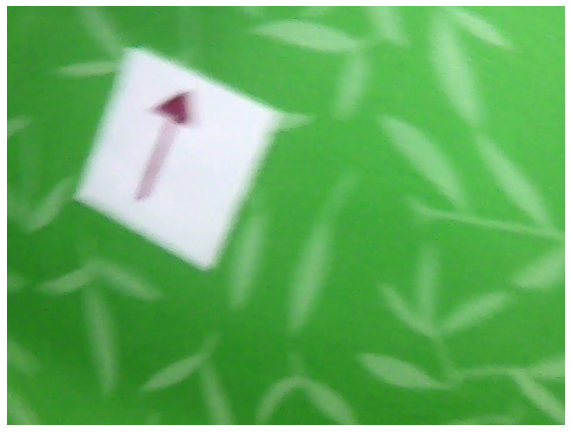

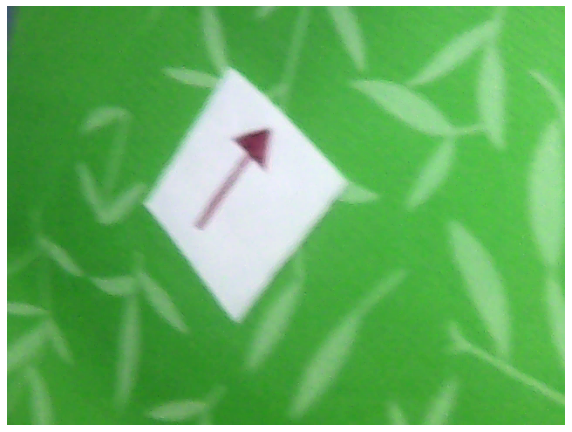

In [2]:
fnames = glob.glob("../data/imgs/arrow/*.png")

images = []

for fname in fnames:
    img = cv2.imread(fname)
    images.append(img)
    plt.imshow (img)
    plt.axis ('off')
    plt.show ()

## Task #2

Код с семинара не работал на всех картинках. Добавил размытие и немного понизил нижний порог цвета. Заработало.
Понятно, что для изображений с обрезанными углами значения будут неточными.
Не очень понятна формула для нахождения расстояния (см. ниже).

In [3]:
low_th  = (180, 180, 180)
high_th = (255, 255, 255)

In [4]:
def find_contour (img, low_th, high_th):
    
    #img_rgb = cv2.cvtColor (img, cv2.COLOR_BGR2RGB) # Преобразование в RGB тут явно лишнее: оно не обязательно
                                                     # для нынешних задач, да и все остальное далее мы делаем в BGR.
                                                     # В других задачах путаница с цветом может быть фатальна.
                                                     # Так что далее я буду работать в BGR по умолчанию.
    
    img = cv2.GaussianBlur(img, (5,5), cv2.BORDER_DEFAULT)
    
    mask = cv2.inRange (img, low_th, high_th) #Поменял
    #                      ^
    #Здесь было изображение в BGR, а не в RGB, в котором мы работем в этой функци.
    #Далее я буду использовать только BGR, чтобы не было потенциальных ошибок
    
    # Разобрался с вторым и третьим параметрами
    contours, hierarchy = cv2.findContours (mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cnt = contours [0]

    approx = cv2.convexHull (cnt)

    epsilon = 0.05 * cv2.arcLength (approx, True)
    
    # Для нагядности еще это отрисовал
    approx = cv2.approxPolyDP (approx, epsilon, True)
    
    #plt.imshow (img)
    #plt.show ()
    
    #plt.imshow (mask)
    #plt.show ()
    
    #cntrs_image = cv2.drawContours(img, cnt, -1, (0,255,0), 5)
    #plt.imshow (cntrs_image)
    
    cntrs_image = cv2.drawContours(img, approx, -1, (0,0,255), 5)
    plt.axis ('off')
    plt.imshow (cntrs_image)
    plt.show ()
    
    return approx

In [5]:
def find_distance (img):

    contour = find_contour (img, low_th, high_th)
    
    length = cv2.arcLength (contour, True)
    
    # Предположу, что тут имеется в виду distance = focal_dist * real_perimeter / rect_on_image_perimeter   
    distance = 180.0 * 364 / length
    
    return distance

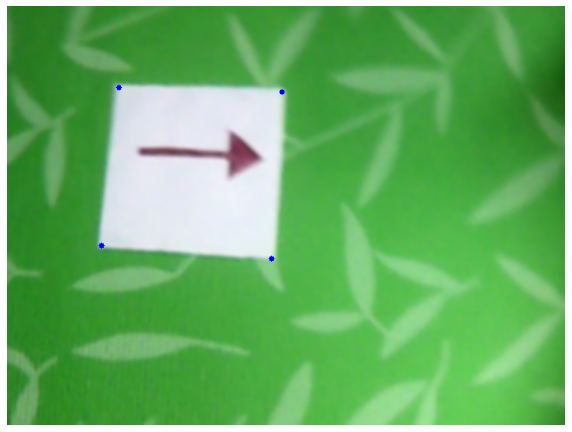

distance #0 = 86.65278514164376
-------------------------------------------------------------------


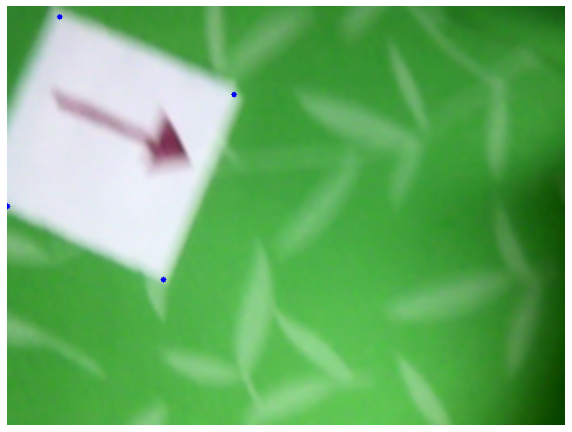

distance #1 = 75.420651011275
-------------------------------------------------------------------


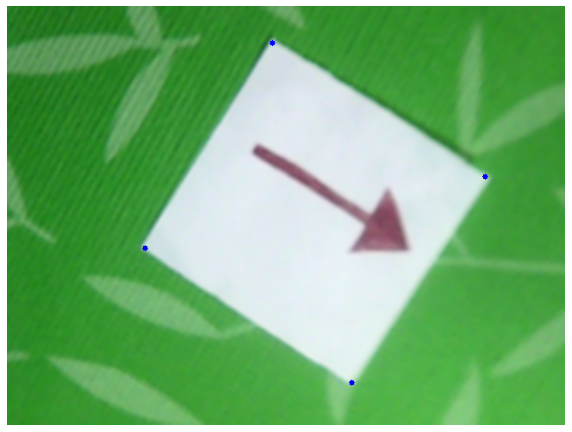

distance #2 = 58.056406693070436
-------------------------------------------------------------------


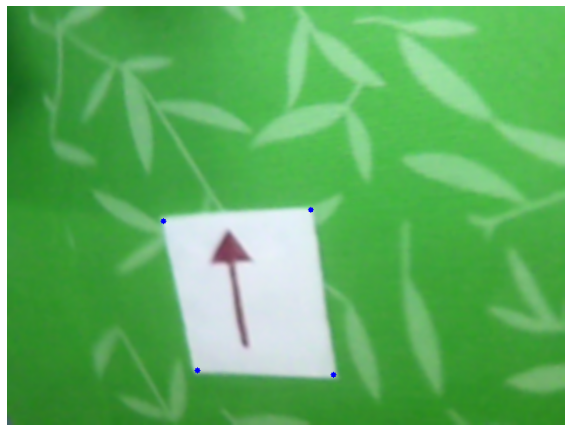

distance #3 = 94.71625118775302
-------------------------------------------------------------------


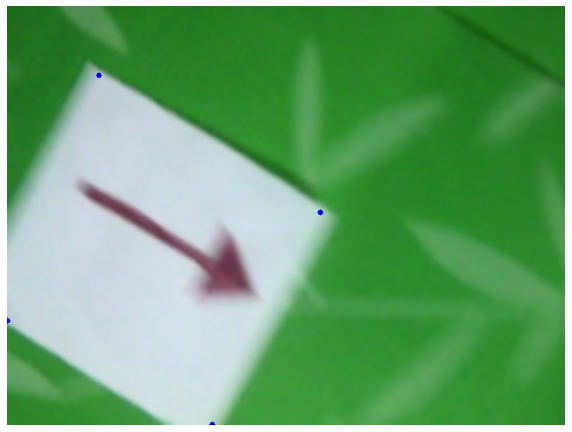

distance #4 = 57.736871342954124
-------------------------------------------------------------------


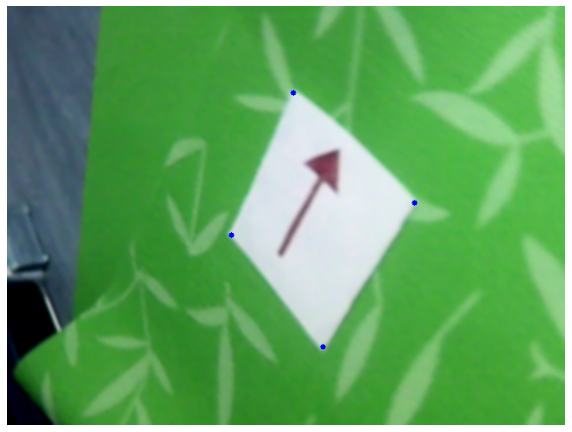

distance #5 = 90.18168193490624
-------------------------------------------------------------------


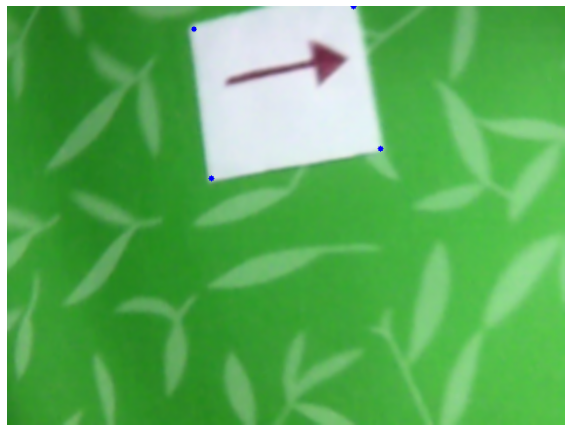

distance #6 = 91.0149293592928
-------------------------------------------------------------------


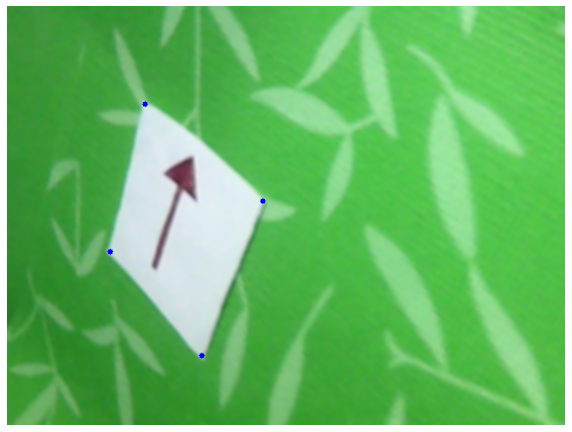

distance #7 = 93.93770534631828
-------------------------------------------------------------------


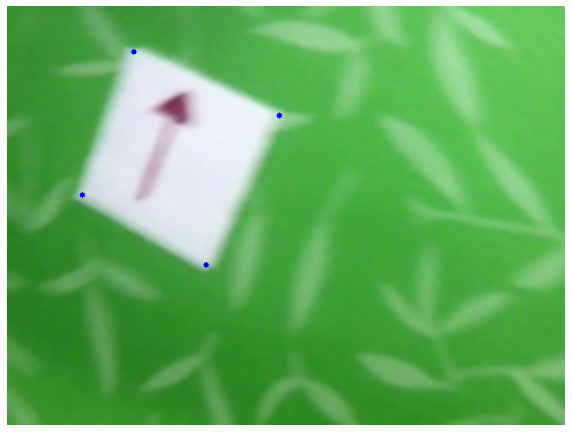

distance #8 = 92.27513596818146
-------------------------------------------------------------------


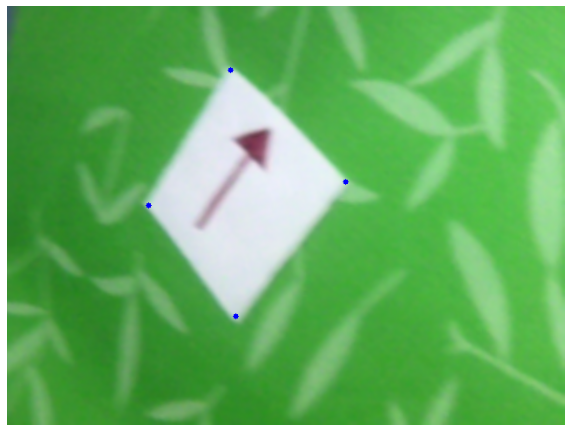

distance #9 = 90.27683134349816
-------------------------------------------------------------------


In [6]:
i = 0
for image in images:
    print("distance #"+str(i)+" = " + str(find_distance(image)))
    print("-------------------------------------------------------------------")
    i += 1

## Task #3

Пояснения в комментариях

In [7]:
def order_points(pts):
    # rect = [tl, tr, br, bl]
    rect = np.zeros((4, 2), dtype="float32")
    
    # Проблема: если граница почти параллельна прямой x=y, то bl может стать равным br, а tr - равным tl.
    
    s    = pts.sum(axis=1)
    diff = np.diff(pts, axis=1) 
    
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]
    
    
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]
    
    return rect

In [60]:
def new_order_points(hull):
    
    # Если почитать документацию cv2.convexHull, то можно узнать, что полученные ею точки расположены против часовой стрелки. Это я и ипользую.
    
    i_min = 0
    for i in range(len(hull)):
        if hull[i][0]**2 + hull[i][1]**2 < hull[i_min][0]**2 + hull[i_min][1]**2:
            i_min = i
        
        
    tl = hull[i_min]
    tr = hull[(i_min + 1)%4]
    br = hull[(i_min + 2)%4]
    bl = hull[(i_min + 3)%4]
        
    # rect = [tl, tr, br, bl]
    rect = np.zeros((4, 2), dtype="float32")
    
    rect[0] = tl
    rect[1] = tr
    rect[2] = br
    rect[3] = bl
    
    return rect

In [61]:
def four_point_transform(image, pts):
    
    rect = new_order_points(pts)
    (tl, tr, br, bl) = rect
    
    corners = copy(image)
    draw_text(corners, "tl", tuple(map(int, tl)), 3)
    draw_text(corners, "tr", tuple(map(int, tr)), 3)
    draw_text(corners, "br", tuple(map(int, br)), 3)
    draw_text(corners, "bl", tuple(map(int, bl)), 3)
    
    plt.imshow (corners)
    plt.axis ('off')
    plt.show ()
    
    widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
    maxWidth = max(int(widthA), int(widthB))
    
    heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
    maxHeight = max(int(heightA), int(heightB))
    
    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]], dtype="float32")
    
    M = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))
    
    return warped

In [62]:
def draw_text(image, text, point, size):
    
    # font
    font = cv2.FONT_HERSHEY_SIMPLEX

    # fontScale
    fontScale = 1

    # Blue color in BGR
    color = (255, 0, 0)

    # Using cv2.putText() method
    return cv2.putText(image, text, point, font, fontScale, color, size, cv2.LINE_AA)

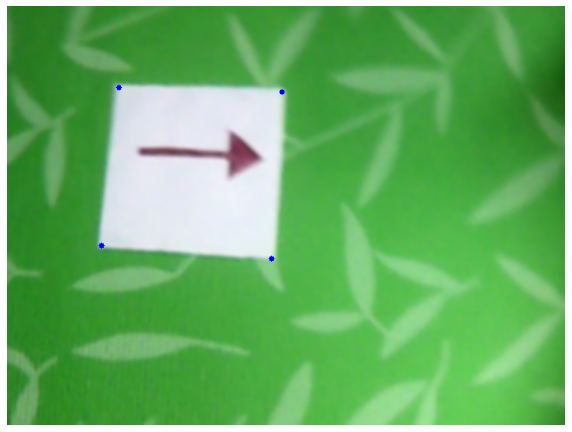

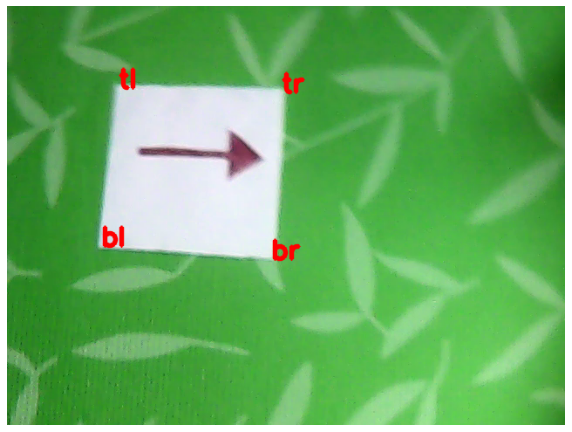

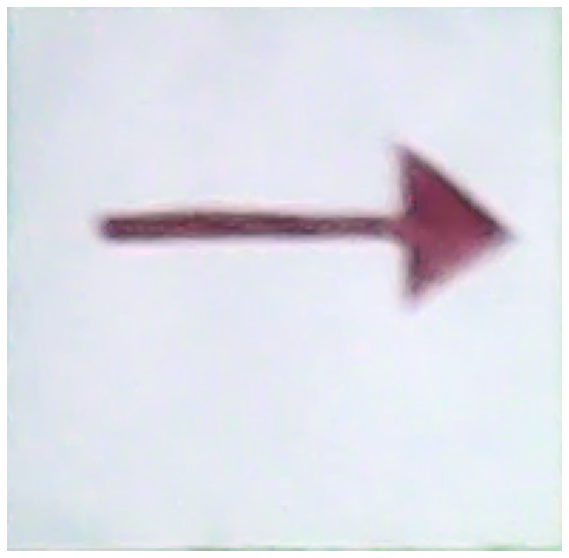

-------------------------------------------------------------------


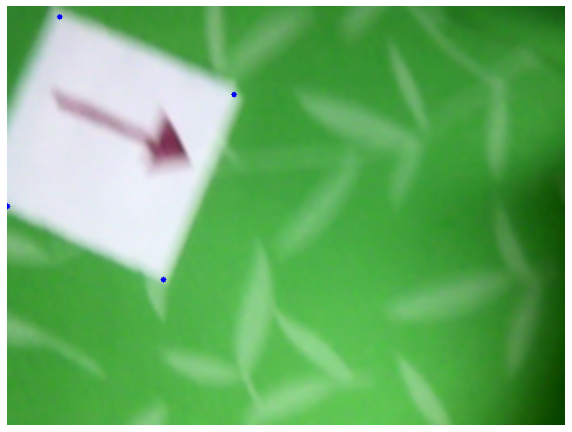

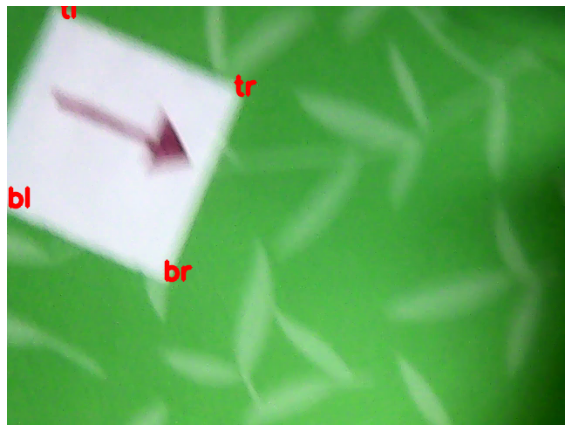

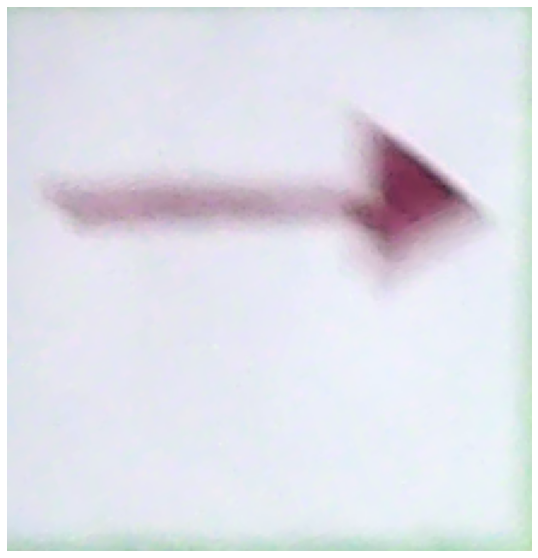

-------------------------------------------------------------------


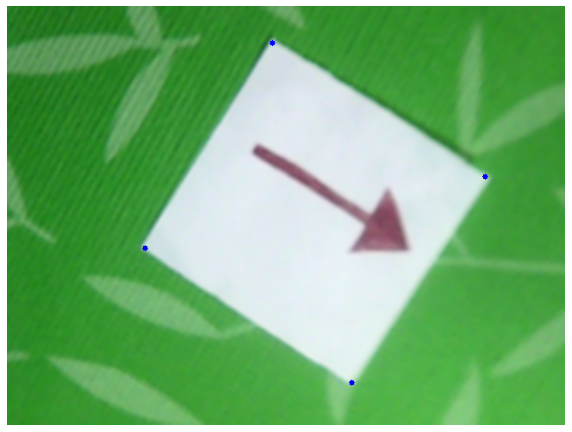

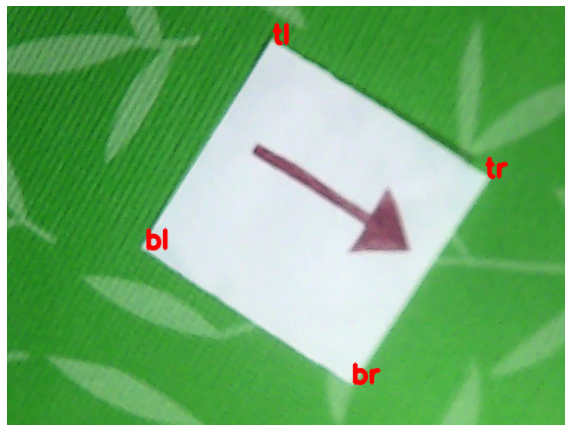

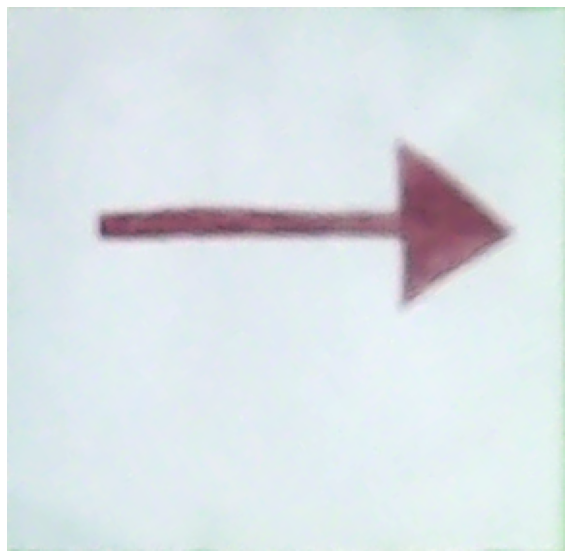

-------------------------------------------------------------------


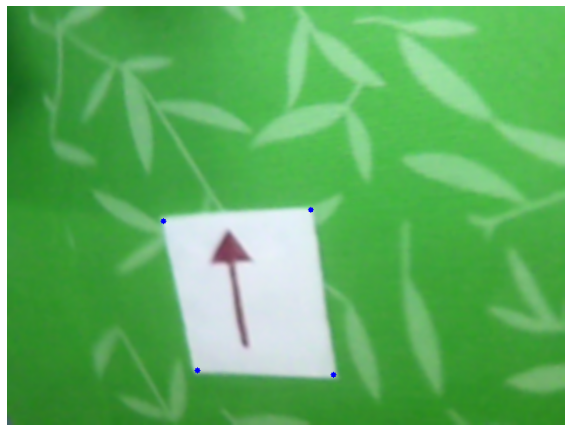

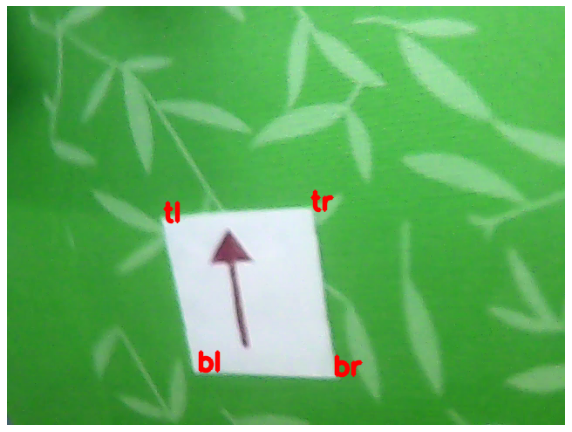

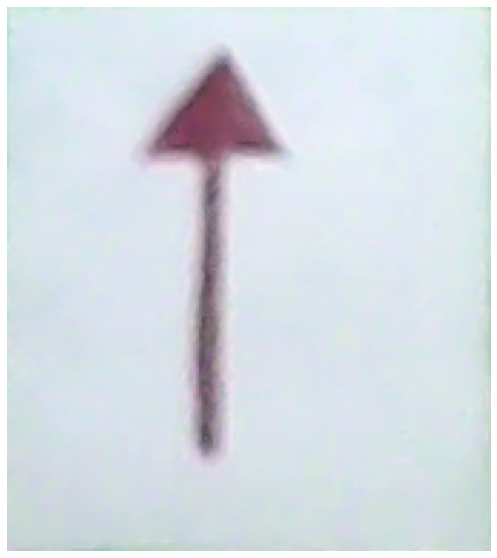

-------------------------------------------------------------------


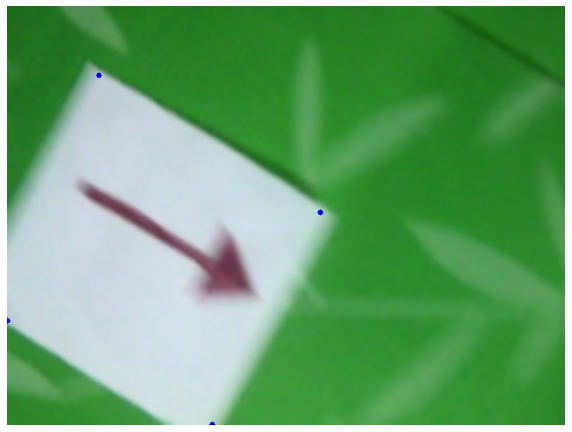

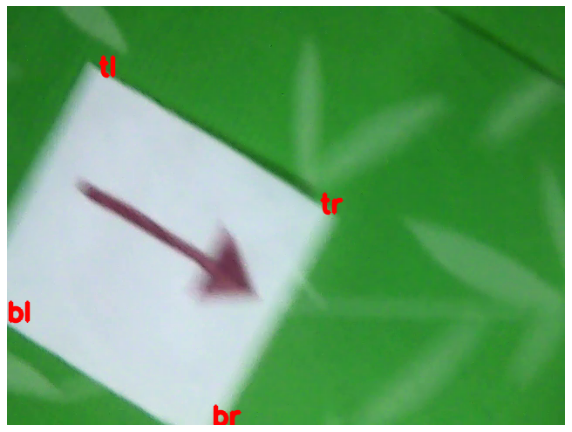

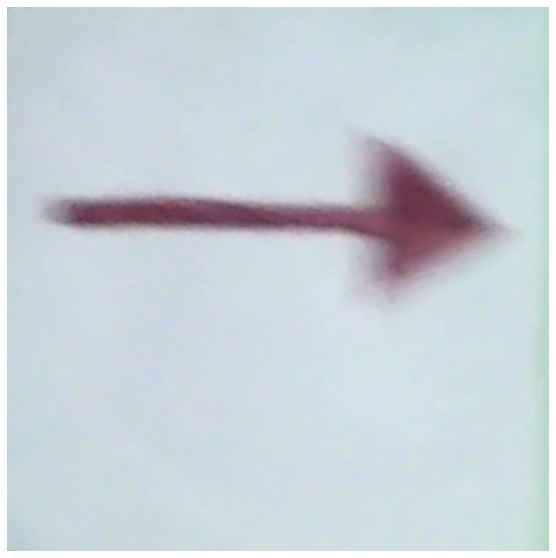

-------------------------------------------------------------------


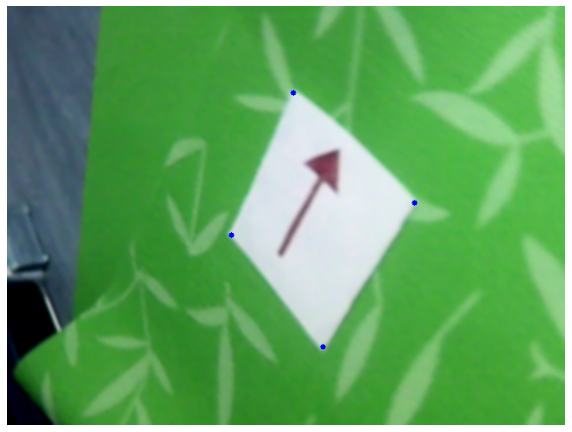

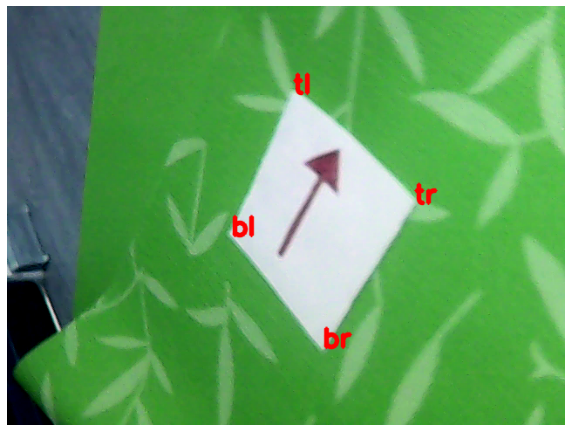

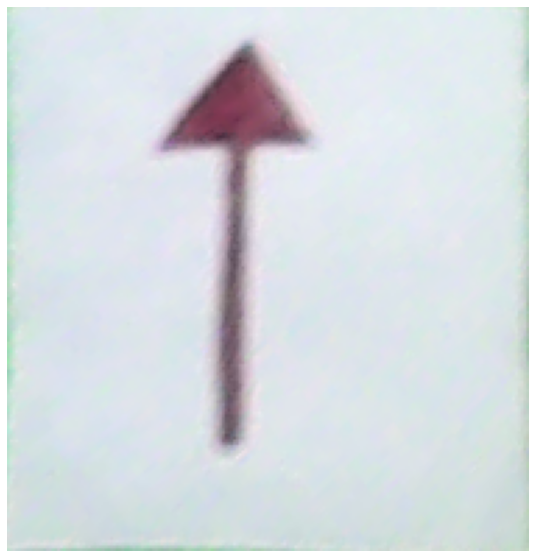

-------------------------------------------------------------------


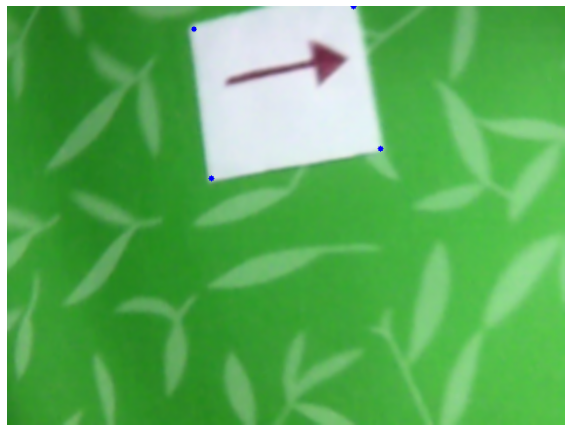

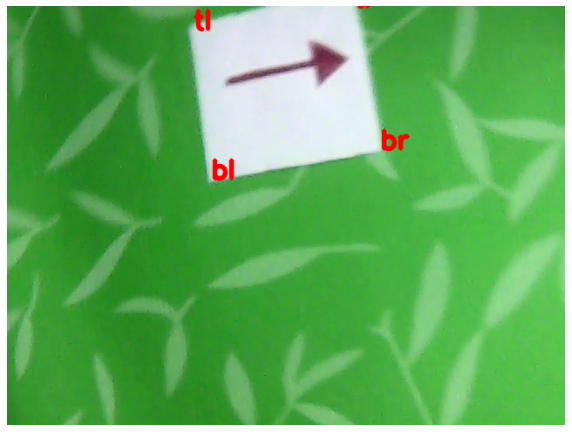

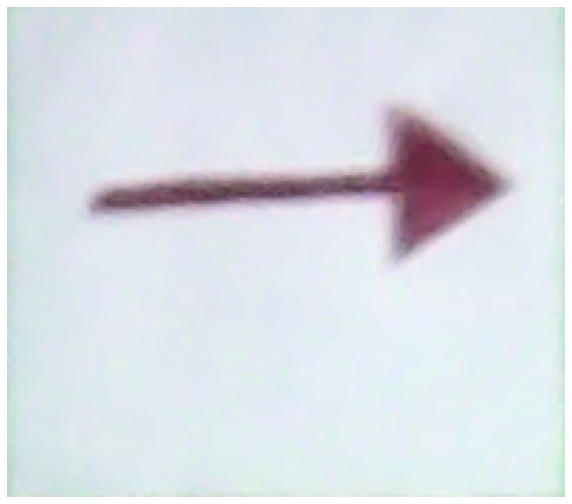

-------------------------------------------------------------------


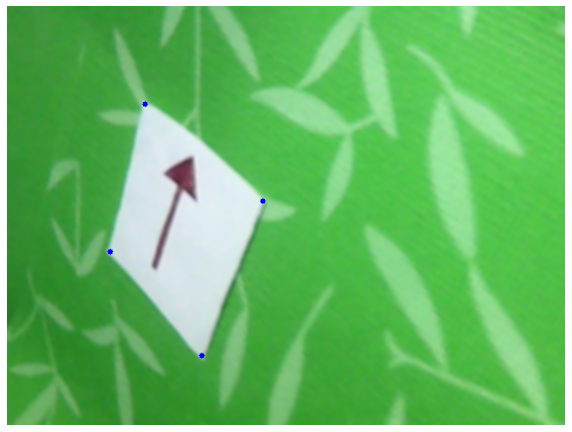

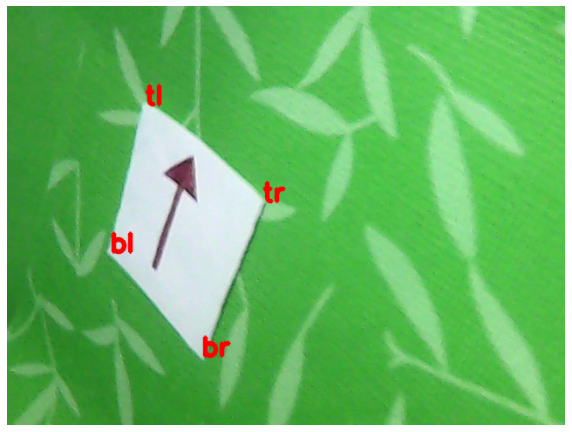

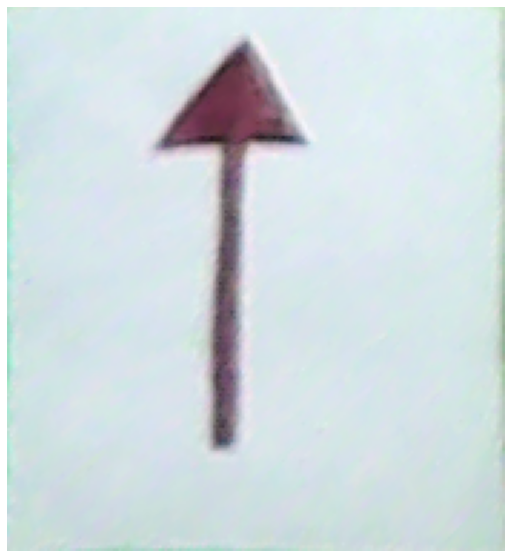

-------------------------------------------------------------------


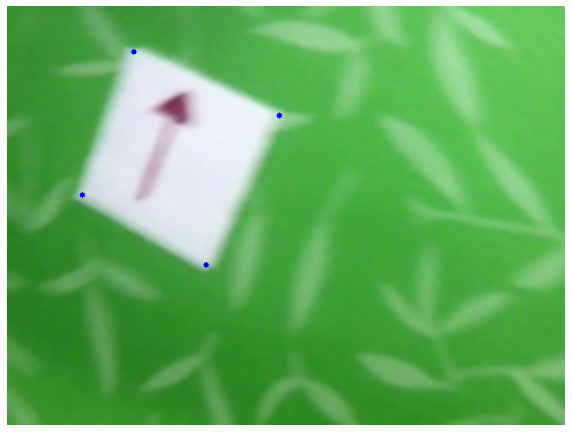

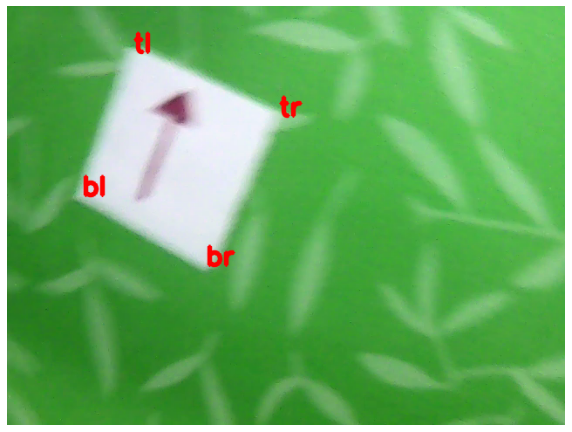

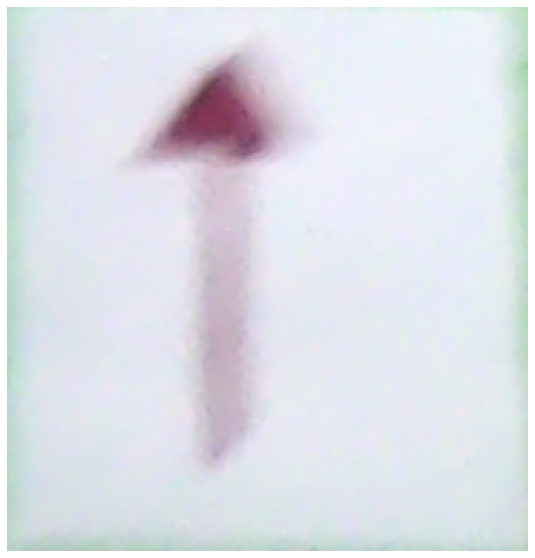

-------------------------------------------------------------------


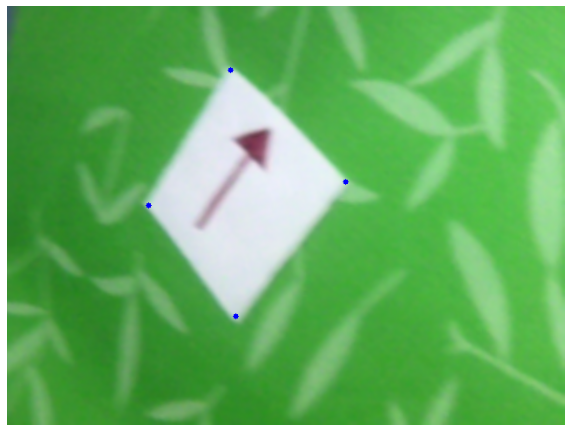

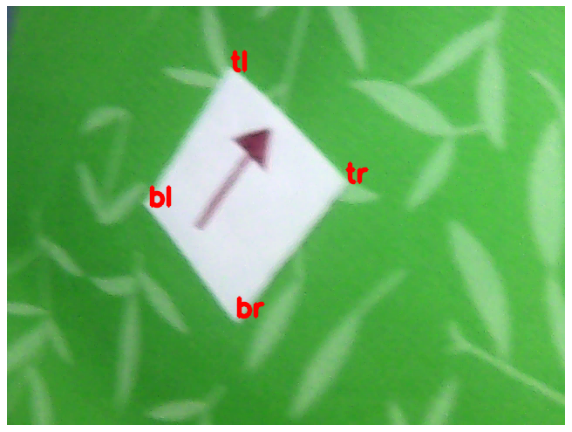

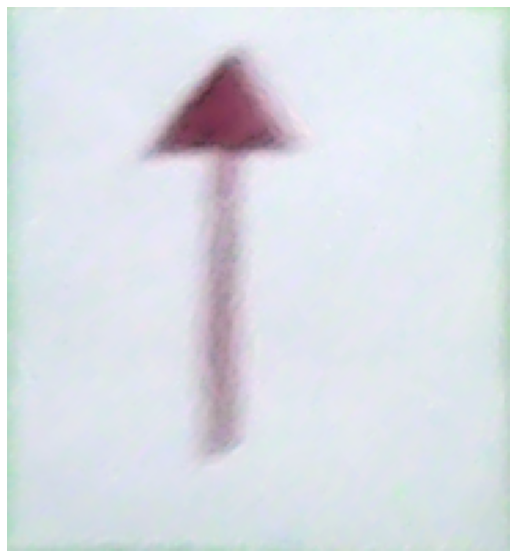

-------------------------------------------------------------------


In [63]:
for image in images:
    approx = find_contour(image, low_th, high_th)
    warped = four_point_transform (image, np.asarray (approx) [:, 0, :])

    plt.imshow (warped)
    plt.axis ('off')
    plt.show ()
    print("-------------------------------------------------------------------")